### imports

In [49]:
import json
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from typing import Optional
from qpsolvers import solve_qp
from copy import deepcopy
from dataclasses import dataclass
from typing import List, Tuple
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches
from matplotlib.colors import TwoSlopeNorm

### percepton class

In [ ]:
class MLP_net(nn.Module):
    '''class of multilayer perceptrons with abs activation function that allows \
        to load weights and linearize the perceptron around a certain point'''
    def __init__(self, inputs: int, layers_size: list[int]) -> None:
        super().__init__()
        self.inputs = inputs
        self.layers = nn.ModuleList([nn.Linear(self.inputs, layers_size[i], bias=True) \
            if i == 0 else nn.Linear(layers_size[i - 1], layers_size[i], bias=True, ) for i in range(len(layers_size))])
        
        self.activation = 'abs'

    def load_json(self, path: str) -> None:
        self.double()
        with open(path, "r") as f:
            model = json.load(f)

        assert self.inputs == model["inputs"]
        assert len(self.layers) == len(model["layers"])

        for layer, model_layer in zip(self.layers, model["layers"]):
            assert layer.out_features == model_layer["outputs"]
            assert sum(model_layer["disabled"]) == 0

            with torch.no_grad():
                for i in range(model_layer["outputs"]):
                    for j in range(model_layer["inputs"]):
                        layer.weight[i, j] = model_layer["w"][i * model_layer["inputs"] + j]

                    layer.bias[i] = model_layer["b"][i]

        self.eval()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        for i, layer in enumerate(self.layers):
            x = layer(x)
            if i < len(self.layers) - 1:
                x = torch.abs(x) 
        return x
    

            
    
    def get_slae(self, input_vector, ignore_target: bool, sign_mode: str, lb = None, ub = None, target_vector = None):
        # choosing linearization point
        if lb is not None and ub is not None and target_vector is not None and not ignore_target and sign_mode == 'mixture':
            vec = input_vector * 0.8 + target_vector * 0.2 
           
        else:
            vec = input_vector
        # variables for linearization like f(z) = A * z + b
        A = np.eye(input_vector.size, input_vector.size)
        b = np.zeros(input_vector.size)
        # matrix of inequalities G * x <= h
        G = []
        h = []
        # matrix of abs activation vectors for layers
        D = []
        for i, layer in enumerate(self.layers):
            vec = layer(torch.from_numpy(vec)).detach().cpu().numpy()
            sign_vec = np.where(vec>=0, 1.0, -1.0)
            margin = 0.05 * np.abs(vec) 
            eps = np.maximum(margin, 1e-3) 
            layer_weights = layer.weight.detach().cpu().numpy()
            layer_bias = layer.bias.detach().cpu().numpy()
            if i < len(self.layers) - 1:
                
                D += [np.diag(sign_vec)]
                G += [-1 * D[i] @ layer_weights @ A]
                h += [D[i] @ (layer_weights @ b + layer_bias) - eps]
                A = D[i] @ layer_weights @ A
                b = layer_weights @ b
                b += layer_bias
                b = D[i] @ b
                vec = np.abs(vec)
            else:
                A = layer_weights @ A
                b = layer_weights @ b
                b += layer_bias
        G = np.vstack(G)
        h = np.hstack(h)
        return A, b, G, h
                

### generation of cells in which the perceptron behaves linearly

In [51]:
@dataclass
class Cell:
    points: List[Tuple[float, float]]
    signs: List[int]


@dataclass
class Line:
    a: float
    b: float
    c: float
    sign: int

    def __call__(self, x: float, y: float) -> float:
        return self.a * x + self.b * y + self.c

    def add(self, line: "Line", weight: float) -> None:
        self.a += weight * line.a
        self.b += weight * line.b
        self.c += weight * line.c


class CellsExtractor:
    def __init__(self, perceptron: MLP_net) -> None:
        self.perceptron = perceptron

    def extract(self, x_min: float, x_max: float, y_min: float, y_max: float, x_axis: int, y_axis: int) -> List[dict]:
        polygon = [(x_min, y_min), (x_min, y_max), (x_max, y_max), (x_max, y_min)]
        lines = self.__get_first_layer_lines(x_axis=x_axis, y_axis=y_axis)
        tree = self.__split_polygons_by_lines(polygon=polygon, lines=lines, key=[])

        layer2lines = [[] for _ in self.perceptron.layers]
        layer2polygons = [{} for _ in self.perceptron.layers]
        layer2lines[0] = lines

        self.__extract_polygons(index=1, layer2lines=layer2lines, tree=tree, x_axis=x_axis, y_axis=y_axis, layer2polygons=layer2polygons)
        return layer2polygons

    def __extract_polygons(self, index: int, layer2lines: List[List[Line]], tree: List[dict], x_axis: int, y_axis: int, layer2polygons: List[dict]) -> None:
        for node in tree:
            layer2polygons[index - 1]["".join(node["key"])] = node["polygon"]

        if index == len(self.perceptron.layers):
            return

        for node in tree:
            for i, sign in enumerate(node["signs"]):
                layer2lines[index - 1][i].sign = sign

            layer2lines[index] = self.__get_layer_lines(index=index, prev_lines=layer2lines[index - 1])
            layer_tree = self.__split_polygons_by_lines(polygon=node["polygon"], lines=layer2lines[index], key=node["key"])
            self.__extract_polygons(index=index + 1, layer2lines=layer2lines, tree=layer_tree, x_axis=x_axis, y_axis=y_axis, layer2polygons=layer2polygons)

    def __get_first_layer_lines(self, x_axis: int, y_axis: int) -> List[Line]:
        layer = self.perceptron.layers[0]
        lines = []

        for i in range(layer.out_features):
            lines.append(Line(a=layer.weight[i, x_axis].item(), b=layer.weight[i, y_axis].item(), c=layer.bias[i].item(), sign=0))

        return lines

    def __get_layer_lines(self, index: int, prev_lines: List[Line]) -> List[Line]:
        layer = self.perceptron.layers[index]
        lines = []

        for i in range(layer.out_features):
            line = Line(a=0, b=0, c=layer.bias[i].item(), sign=0)

            for j in range(layer.in_features):
                activation = 1

                if self.perceptron.activation == "abs":
                    activation = 1 if prev_lines[j].sign >= 0 else -1
                elif self.perceptron.activation == "relu":
                    activation = 1 if prev_lines[j].sign >= 0 else 0
                elif self.perceptron.activation == "leaky-relu":
                    activation = 1 if prev_lines[j].sign >= 0 else 0.01

                line.add(prev_lines[j], weight=layer.weight[i, j].item() * activation)

            lines.append(line)

        return lines

    def __split_polygons_by_lines(self, polygon: List[Tuple[float, float]], lines: List[Line], key: List[int]) -> List[dict]:
        tree = [{"signs": [], "key": key, "polygon": polygon}]

        for line in lines:
            new_tree = []

            for node in tree:
                lower, upper = self.__split_polygon(polygon=node["polygon"], line=line)

                if len(upper) > 2:
                    new_tree.append({"signs": node["signs"] + [1], "key": node["key"] + ["+"], "polygon": upper})

                if len(lower) > 2:
                    new_tree.append({"signs": node["signs"] + [-1], "key": node["key"] + ["-"], "polygon": lower})

            tree = new_tree

        return tree

    def __split_polygon(self, polygon: List[Tuple[float, float]], line: Line) -> Tuple[List[Tuple[float, float]], List[Tuple[float, float]]]:
        polygon1, polygon2 = [], []

        for i, (x1, y1) in enumerate(polygon):
            x2, y2 = polygon[(i + 1) % len(polygon)]
            sign1, sign2 = line(x1, y1), line(x2, y2)

            if sign1 <= 0:
                polygon1.append(polygon[i])

            if sign1 >= 0:
                polygon2.append(polygon[i])

            if sign1 * sign2 >= 0:
                continue

            t = sign1 / (sign1 - sign2)
            p = (x1 + t * (x2 - x1), y1 + t * (y2 - y1))
            polygon1.append(p)
            polygon2.append(p)

        return polygon1, polygon2

### functions of attacks

In [52]:
rng = np.random.default_rng(10)

In [ ]:
def get_mask(kind: str, n: int) -> np.ndarray:
    '''function for selecting coordinates that will be limited during attack proccess'''
    if kind == "all":
        return np.ones(n, dtype=bool)
    if kind == "axis_x":
        return np.array([True, False])
    if kind == "axis_y":
        return np.array([False, True])


In [ ]:
def qp_attack(input_vector: np.ndarray, input_class: int, target_vector: np.ndarray, ignore_target: bool, diff: float, mask_type: str, lb: np.ndarray, ub: np.ndarray, model: MLP_net, sign_mode: str) -> Optional[np.ndarray]:
    '''making quadratic proggramming attack on perceptron'''
    
    #getting condtions
    lb = deepcopy(lb)
    ub = deepcopy(ub)
    with torch.no_grad():
        A, b, G, h = model.get_slae(input_vector=input_vector, lb=lb, ub=ub, target_vector=target_vector, ignore_target=ignore_target, sign_mode=sign_mode)
        
    p = np.eye(input_vector.size, dtype=np.float64)
    q = -input_vector.astype(np.float64)
    
    #limiting part of the coordinates during the attack search
    mask = get_mask(mask_type, input_vector.size)
    
    lb[mask] = np.clip(input_vector[mask] - diff * (ub[mask] - lb[mask]), lb[mask], ub[mask])
    ub[mask] = np.clip(input_vector[mask] + diff * (ub[mask] - lb[mask]), lb[mask], ub[mask])
    
    #forming a system consisting of equations and inequalities, or only inequalities
    if ignore_target:
        
        A_eq = None
        b_eq = None
        
        y0 = model(torch.from_numpy(input_vector)).item()
        eps = max(0.05 * abs(y0), 1e-2)
        G  = np.vstack([G, input_class * A])
        h  = np.hstack([h, -eps - input_class * b])  
    else:
        A_eq = A
        b_eq = model(torch.tensor(target_vector)).item() - b
        
    #making attack
    attacked_vector = solve_qp(P=p, q=q, A=A_eq, b=b_eq, G=G, h=h, lb=lb, ub=ub, solver='ecos')

    #print(np.min(attacked_vector), np.max(attacked_vector))
    return attacked_vector


In [ ]:
def split_matrix_attack(input_vector: np.ndarray, target_vector: np.ndarray, ignore_target: bool, model: MLP_net, sign_mode: str) -> np.ndarray:
    '''making matrix attack on perceptron'''
    with torch.no_grad():
        A, b, G, h = model.get_slae(input_vector=input_vector, ignore_target=ignore_target, sign_mode=sign_mode)

    indices = np.random.choice(range(A.shape[1]), A.shape[0], replace=False)
    other_indices = np.array([i for i in range(A.shape[1]) if i not in indices])

    x = np.random.uniform(0, 1, input_vector.size) if ignore_target else deepcopy(target_vector)
    x_changed = np.linalg.solve(A[:, indices], (b.T - np.matmul(A[:, other_indices], x[other_indices])))
    x[indices] = x_changed
    #print(x_changed)
    return x
        

### perceptron visualization

In [ ]:
def prepare_static_plot(model: MLP_net, train_df: pd.DataFrame, view_range: tuple = (-1.5, 1.5), n: int = 600) -> tuple[plt.Figure, plt.Axes, dict]:
    '''
    visualization of dataset points, background coloration in the colors \
        of the model's work, and linearity cells of the model'''
    xs = np.linspace(*view_range, n)
    ys = np.linspace(*view_range, n)
    grid = np.c_[np.meshgrid(xs, ys)].reshape(2, -1).T

    device = next(model.parameters()).device
    with torch.no_grad():
        z = (
            model.forward(torch.tensor(grid, dtype=torch.float64, device=device))
            .cpu().numpy().ravel()
        )
    Z = z.reshape(n, n)

    cmap = ListedColormap(
        ["#1f77b4", "#5d9bd6", "#a9c9ea", "#ffffff",
         "#f7b0b0", "#e37878", "#d62728"]
    )
    norm = TwoSlopeNorm(vmin=-1.0, vcenter=0.0, vmax=1.0)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_title("Атака на синий класс")
    ax.pcolormesh(xs, ys, Z, cmap=cmap, norm=norm, shading="auto")

    ax.scatter(
    train_df.loc[train_df.label == -1, "x1"],
    train_df.loc[train_df.label == -1, "x2"],
    color="#1f77b4", label="negative class", edgecolors="k", linewidths=0.3, s=20
    )

    ax.scatter(
        train_df.loc[train_df.label == 1, "x1"],
        train_df.loc[train_df.label == 1, "x2"],
        color="#d62728", label="positive class", edgecolors="k", linewidths=0.3, s=20
    )


    cells = CellsExtractor(model).extract(*view_range, *view_range, 0, 1)[-1]
    for poly in cells.values():
        ax.add_patch(
            patches.Polygon(poly, fill=False, lw=.3,
                            edgecolor="#666666", alpha=.7)
        )

    ax.set_xlim(view_range); ax.set_ylim(view_range); ax.set_aspect("equal")
    ax.legend(loc="upper right")

    cache = {"xs": xs, "ys": ys}
    return fig, ax, cache

### loading models

In [ ]:
#model trained using background points
unar_net = MLP_net(inputs=2, layers_size=[10, 10, 1])
unar_net.load_json('C:/Users/Nikit/OneDrive/Рабочий стол/experiments_work/model_2-10-10-1 (1).json')
unar_net.eval()
unar_net.double()

MLP_net(
  (layers): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Linear(in_features=10, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=1, bias=True)
  )
)

In [ ]:
# classic perceptron model
mlp_net = MLP_net(inputs=2, layers_size=[10, 10, 1])
mlp_net.load_json('C:/Users/Nikit/OneDrive/Рабочий стол/experiments_work/model_2-10-10-1 (2).json')
mlp_net.eval()
mlp_net.double()

MLP_net(
  (layers): ModuleList(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): Linear(in_features=10, out_features=10, bias=True)
    (2): Linear(in_features=10, out_features=1, bias=True)
  )
)

### loading dataset of two spirals

In [59]:
df_train = pd.read_csv('C:/Users/Nikit/OneDrive/Рабочий стол/experiments_work/train.csv', sep=';')
df_train.head(100)

,x1,x2,label
0,-0.531946,-0.763196,1
1,0.156891,-0.284936,-1
2,0.292827,-0.003426,-1
3,-0.504414,-0.282785,-1
4,0.265287,-0.228761,-1
...,...,...,...
95,0.239764,-0.688448,1
96,0.576092,-0.178189,1
97,0.142812,0.063300,-1
98,-0.380328,-0.349024,-1


In [60]:
X_train = torch.tensor(df_train[['x1', 'x2']].values, dtype=torch.float64)
y_train = torch.tensor(df_train['label'].values, dtype=torch.float64)
dataset_train = TensorDataset(X_train, y_train)

In [ ]:
#variables for classes from dataset
df_pos = df_train[df_train['label'] == 1]
df_neg = df_train[df_train['label'] == -1]


X_pos = df_pos[['x1', 'x2']].to_numpy() 
X_neg = df_neg[['x1', 'x2']].to_numpy()

### making experiments

In [ ]:
def make_experiments(diffes: list, sign_modes: list, mask_types: list, \
    X_pos: np.ndarray, X_neg: np.ndarray, ignore_targets: list, lb: np.ndarray, \
        ub: np.ndarray, models: list, train_df: pd.DataFrame, attack_mode: str = "qp"):
    ''' function for automatically searching for attacks under \
        different conditions and plotting the results'''
    for diff in diffes:
        for mask in mask_types:
            for sign_mode in sign_modes:
                for ignore_target in ignore_targets:
                    for i, model in enumerate(models):
                        
                        attacks = []
                        for vec_pos in X_pos:
                            if np.sign(model(torch.tensor(vec_pos)).item()) != 1: continue
                            if ignore_target == False:
                                for vec_neg in X_neg:
                                    if np.sign(model(torch.tensor(vec_neg)).item()) != -1: continue
                                    lb_ = deepcopy(lb)
                                    ub_ = deepcopy(ub)
                                    if attack_mode == "qp":
                                        res = (qp_attack(input_vector=vec_pos, target_vector=vec_neg, ignore_target=ignore_target, \
                                        diff=diff, mask_type=mask, lb=lb_, ub=ub_, model=model, sign_mode=sign_mode, input_class=1))
                                    else:
                                        res = split_matrix_attack(input_vector=vec_pos,
                                                    target_vector=vec_neg,
                                                    ignore_target=ignore_target,
                                                    model=model,
                                                    sign_mode=sign_mode)
                                    if res is not None:
                                        if ((i == 0 and not (-0.1 <= model(torch.tensor(res)).item() <= 0.1)) or i != 0):
                                            attacks += [res]
                            else:
                                target_vec = np.zeros_like(vec_pos)
                                lb_ = deepcopy(lb)
                                ub_ = deepcopy(ub)
                                if attack_mode == "qp":
                                    res = (qp_attack(input_vector=vec_pos, target_vector=target_vec, ignore_target=ignore_target, \
                                        diff=diff, mask_type=mask, lb=lb_, ub=ub_, model=model, sign_mode=sign_mode, input_class=1))
                                else:
                                    res = split_matrix_attack(input_vector=vec_pos,
                                                    target_vector=target_vec,
                                                    ignore_target=ignore_target,
                                                    model=model,
                                                    sign_mode=sign_mode)
                                if res is not None:
                                    if ((i == 0 and not (-0.1 <= model(torch.tensor(res)).item() <= 0.1)) or i != 0):
                                        attacks += [res]  
                        print("_______________________________________")         
                        print(f'diff = {diff}, mask = {mask}, sign_mode = {sign_mode}, ignore target = {ignore_target}, model_ind = {i}')
                        if len(attacks) == 0: print("нет успешных атак"); continue
                        attacks = np.vstack(attacks)
                        
                        fig, ax, cache = prepare_static_plot(model, train_df)

                        ax.scatter(attacks[:, 0], attacks[:, 1], color='violet', label='attacks on negative class')
                        ax.legend()
                        plt.show()

                                                                

### basic experiments

c:\Users\Nikit\AppData\Local\Programs\Python\Python310\lib\site-packages\qpsolvers\solvers\ecos_.py:150: UserWarning: ECOS returned exit flag 1 (PINF: found certificate of primal infeasibility)
  warnings.warn(f"ECOS returned exit flag {flag} ({meaning})")


_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


c:\Users\Nikit\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


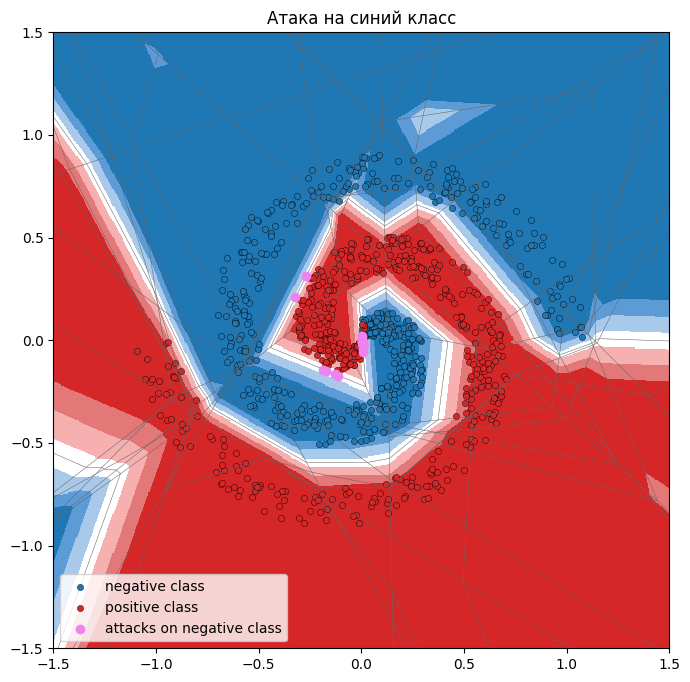

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


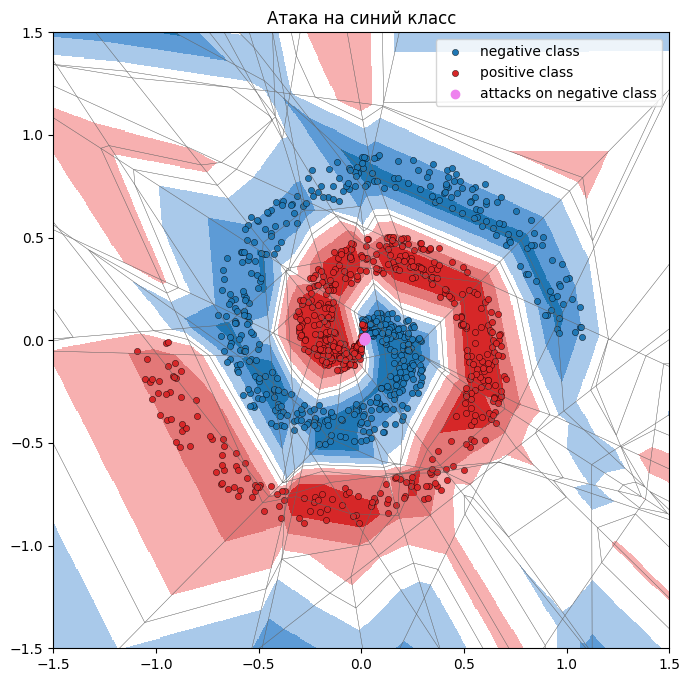

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


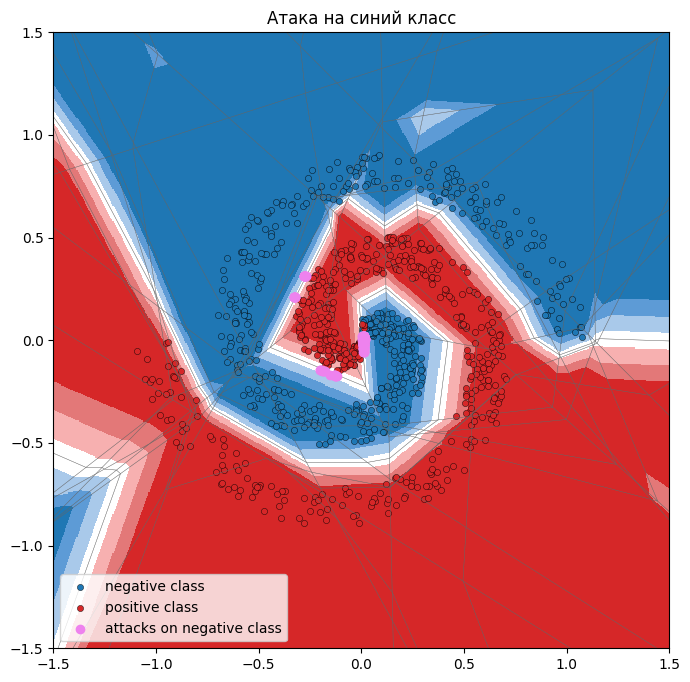

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = True, model_ind = 1


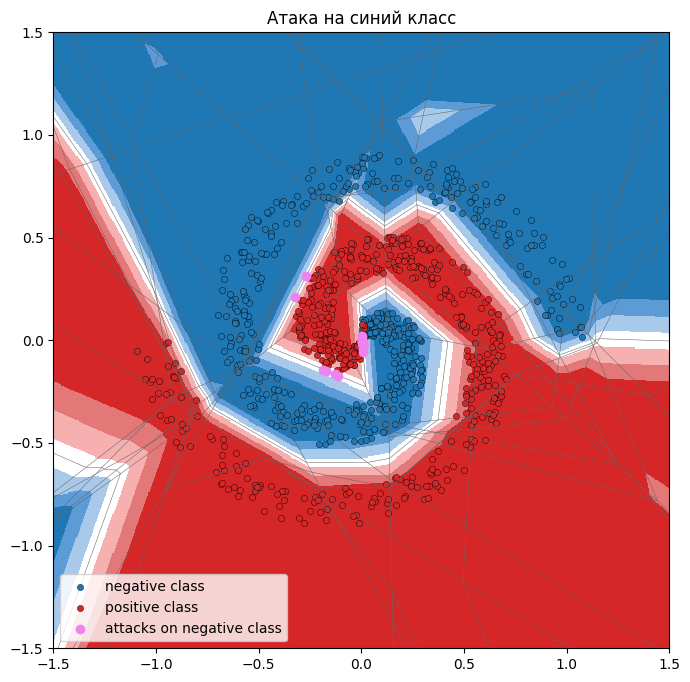

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = False, model_ind = 0


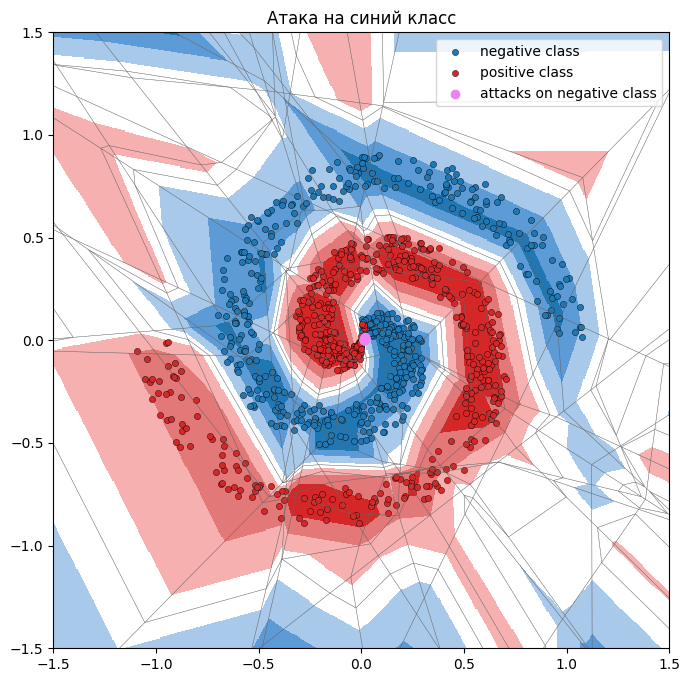

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = False, model_ind = 1


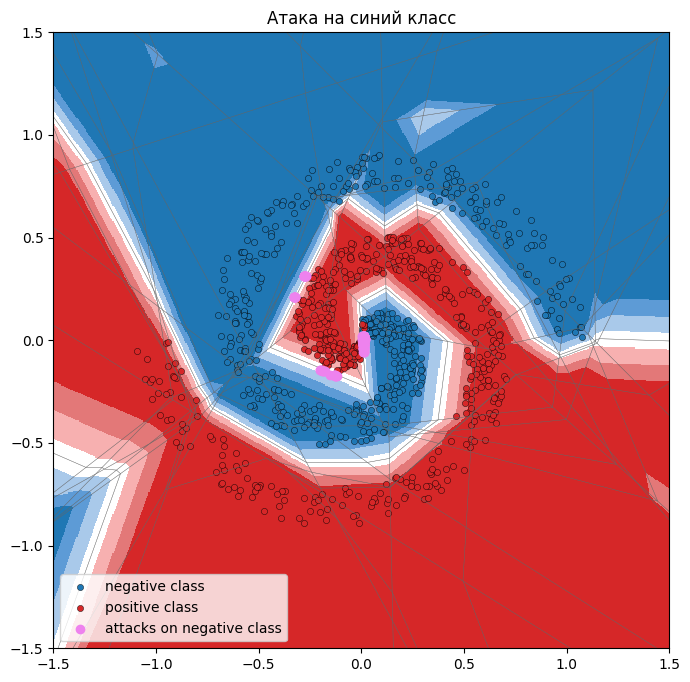

_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


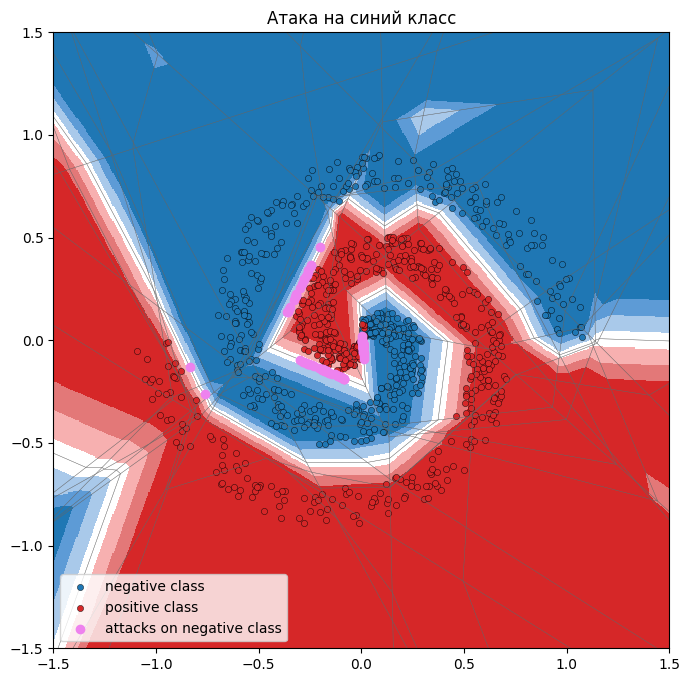

_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


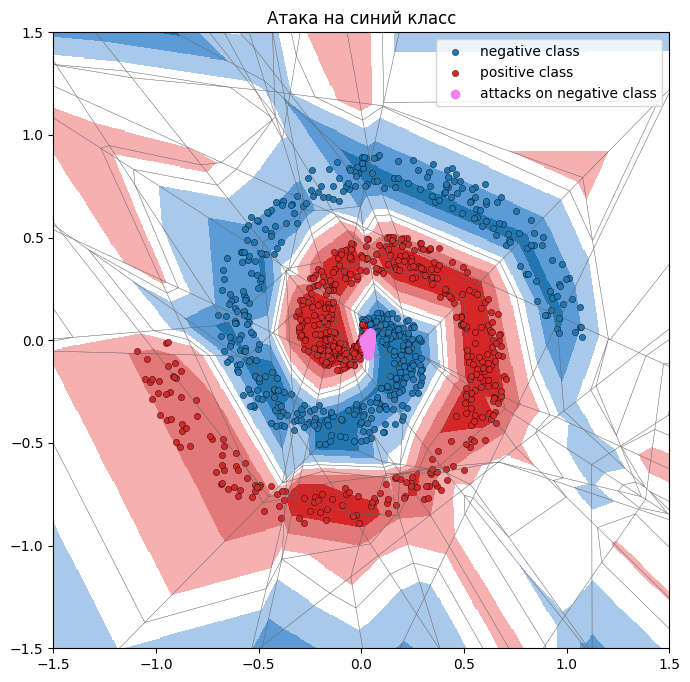

_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


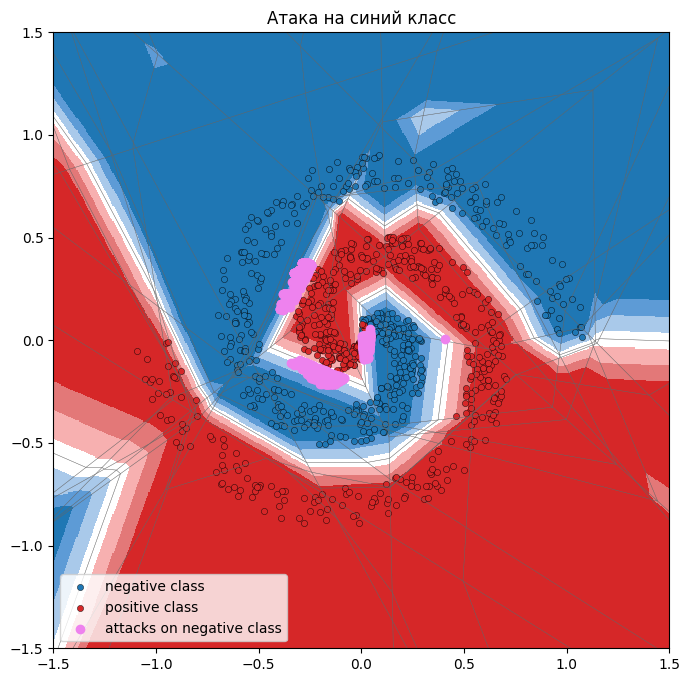

_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = True, model_ind = 1


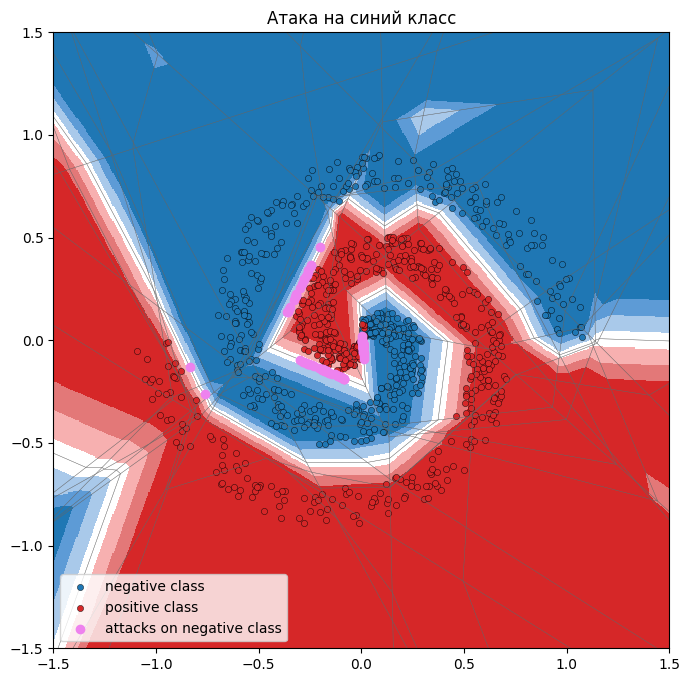

c:\Users\Nikit\AppData\Local\Programs\Python\Python310\lib\site-packages\qpsolvers\solvers\ecos_.py:150: UserWarning: ECOS returned exit flag 10 (INACC_OFFSET: inaccurate results)
  warnings.warn(f"ECOS returned exit flag {flag} ({meaning})")


_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = False, model_ind = 0


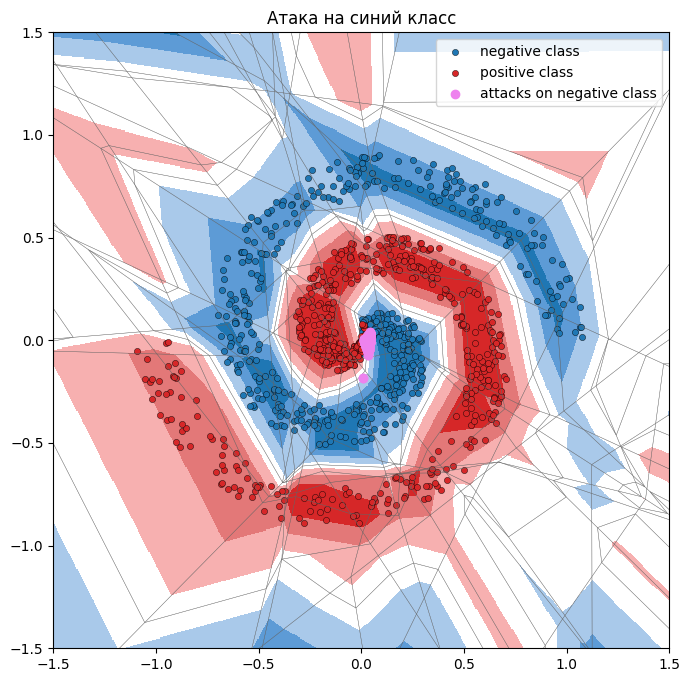

_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = False, model_ind = 1


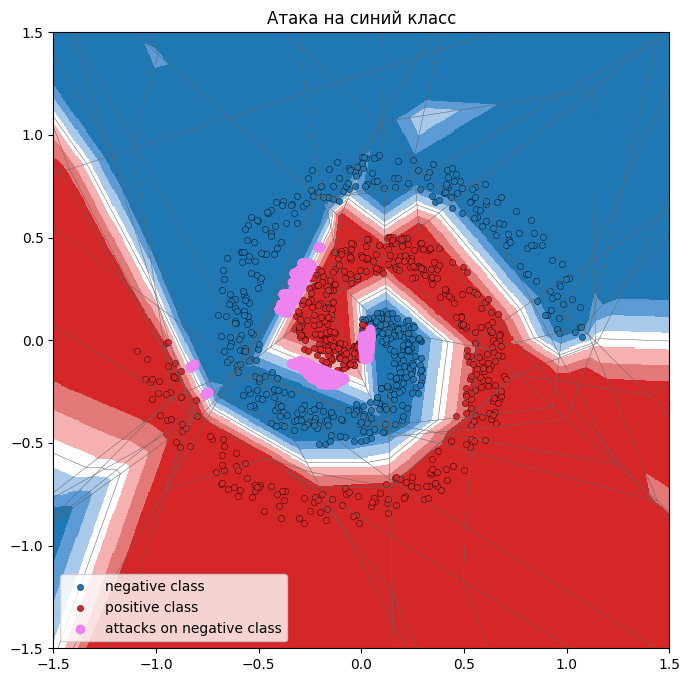

_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


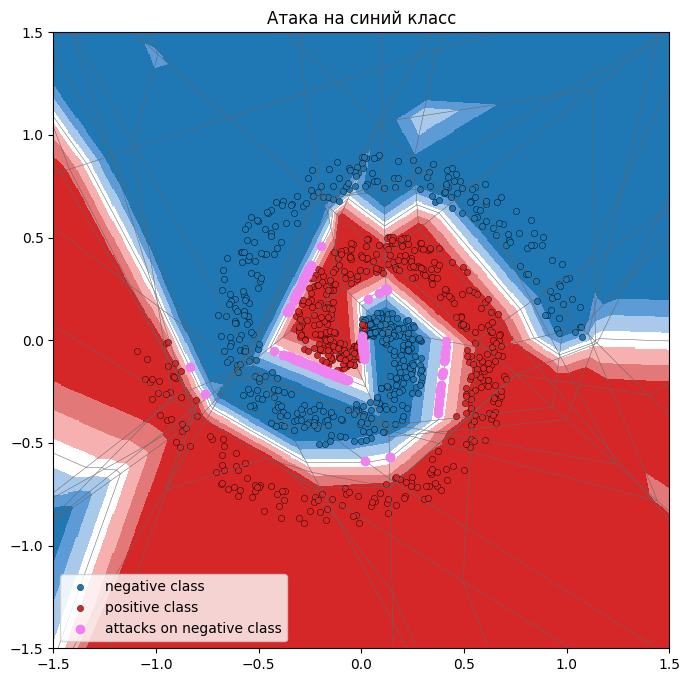

_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


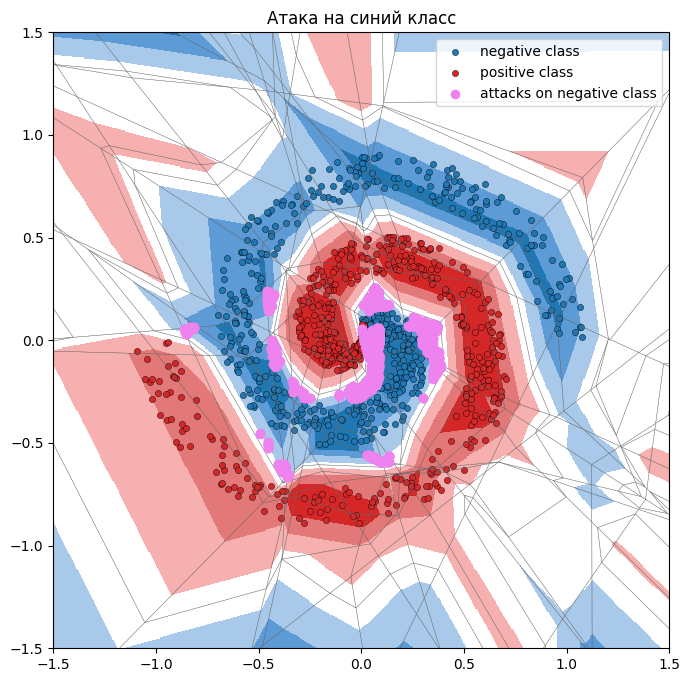

_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


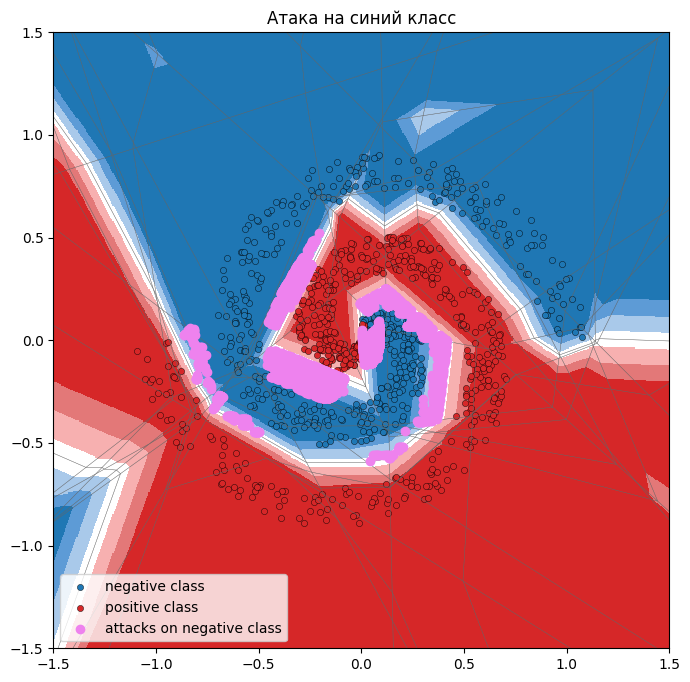

_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = True, model_ind = 1


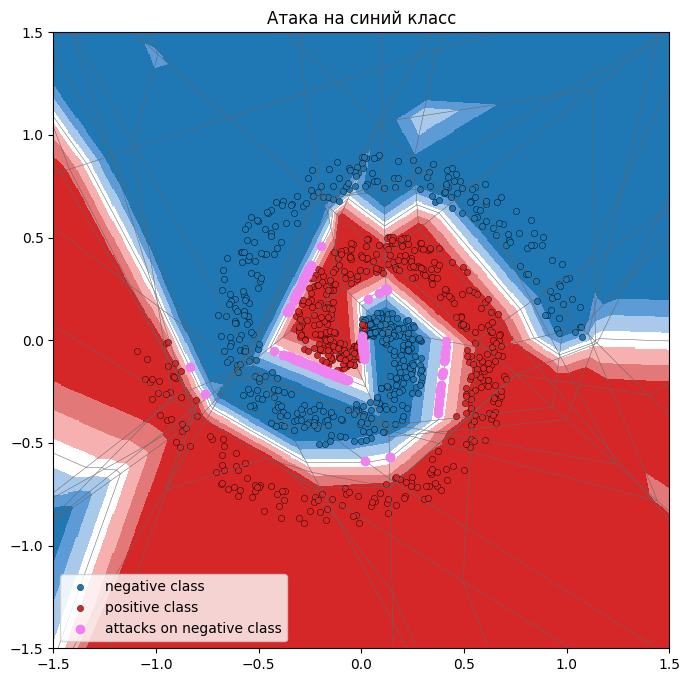

_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = False, model_ind = 0


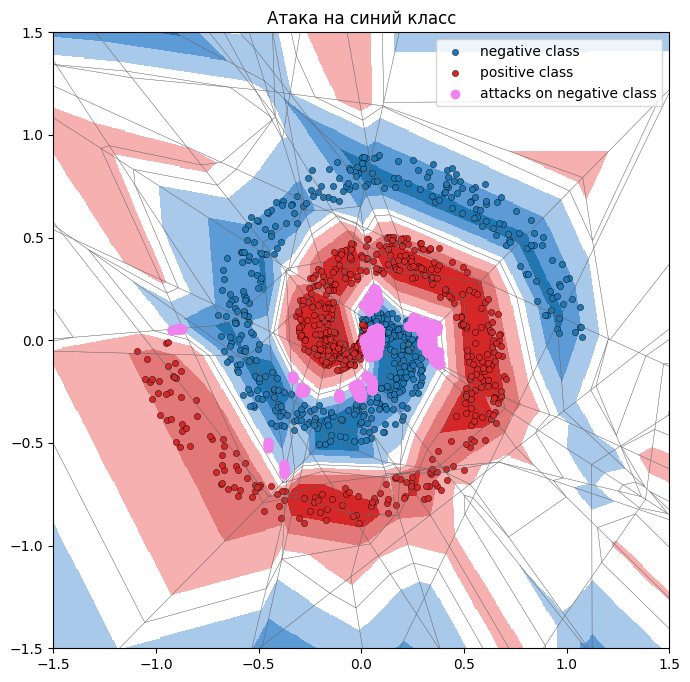

_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = False, model_ind = 1


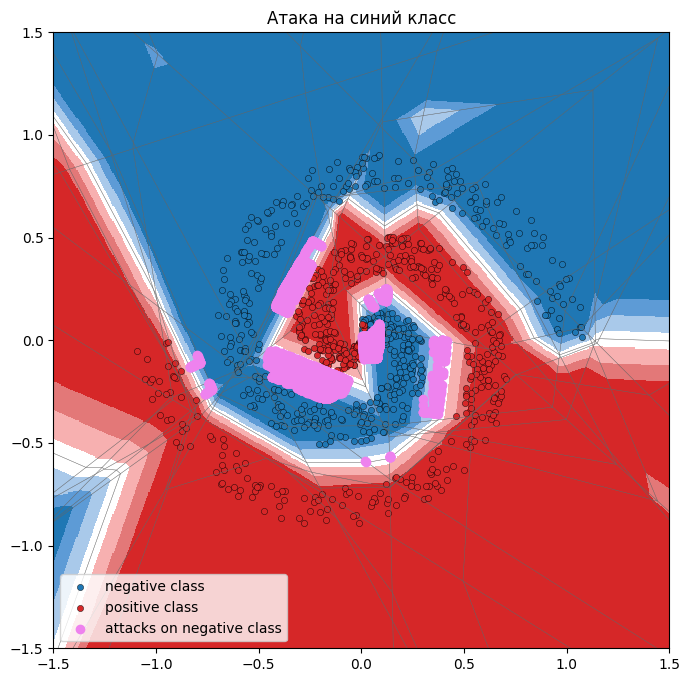

_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


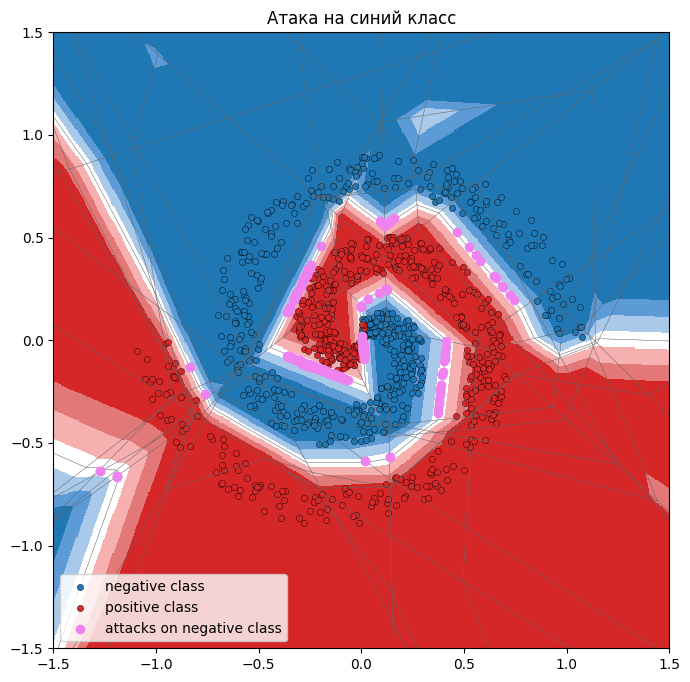

_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


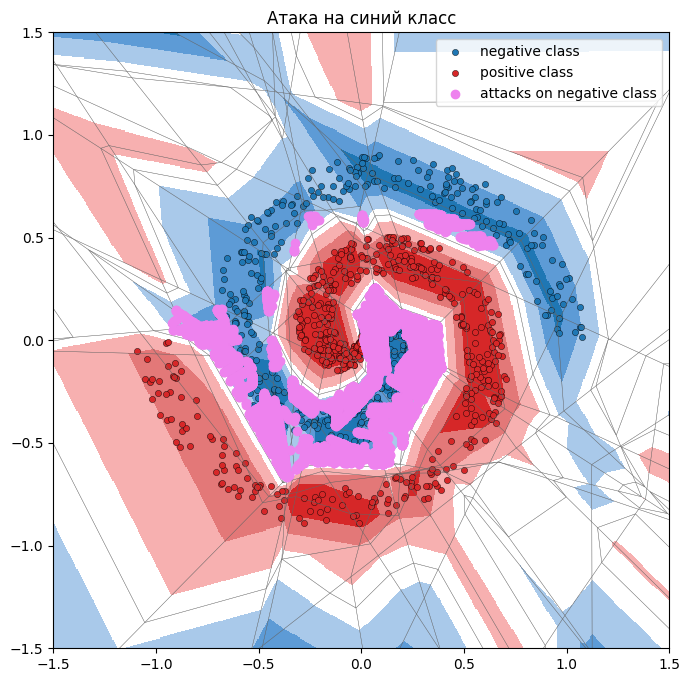

_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


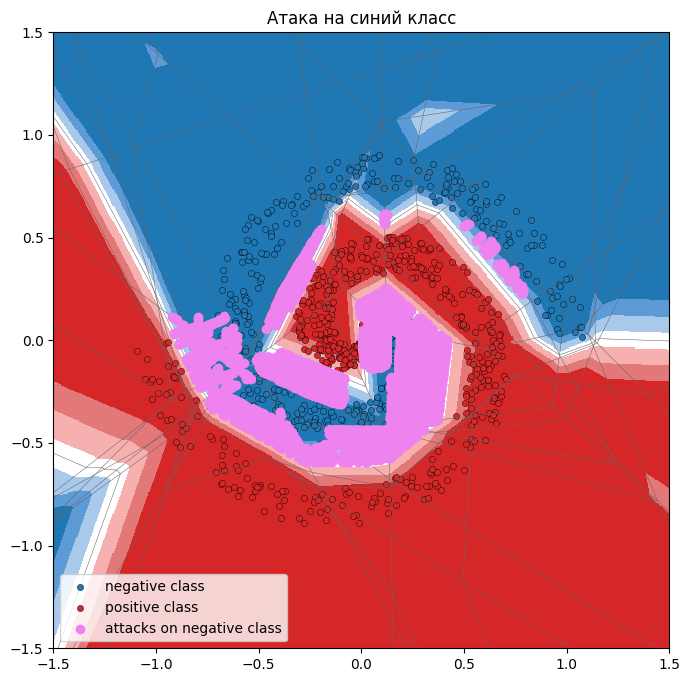

_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = True, model_ind = 1


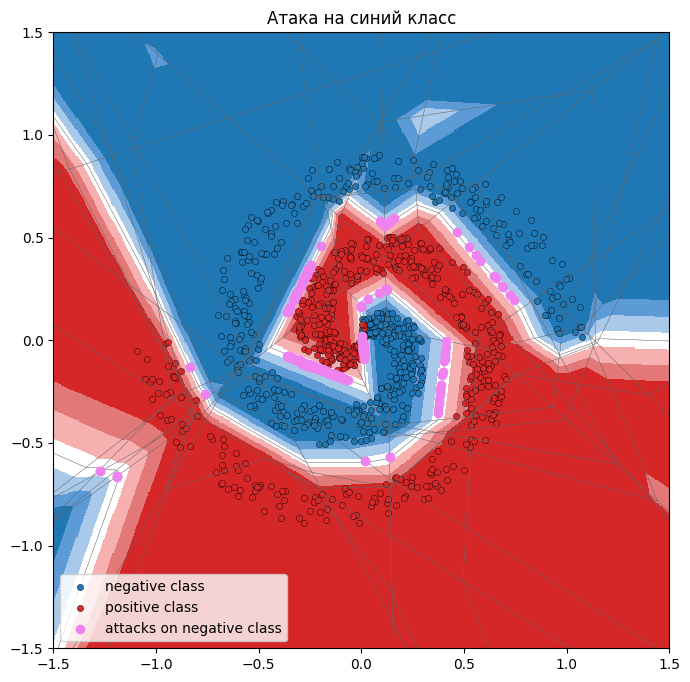

_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = False, model_ind = 0


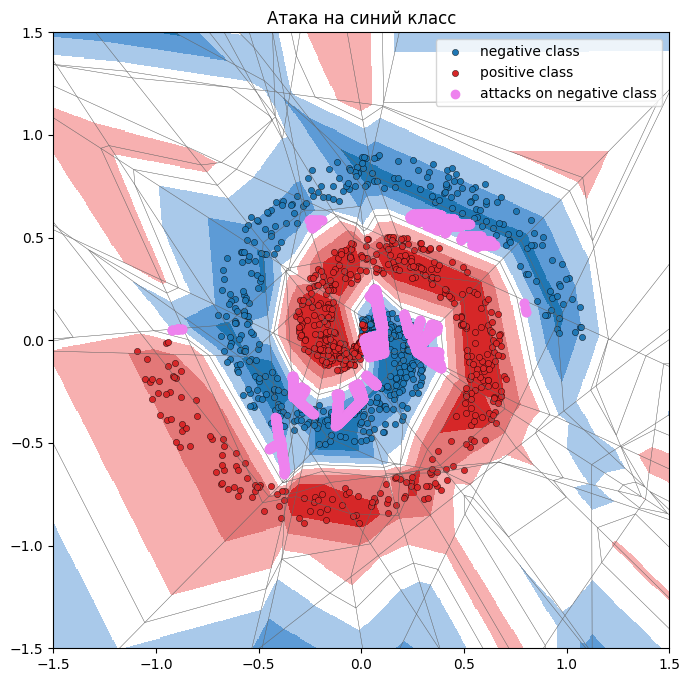

_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = False, model_ind = 1


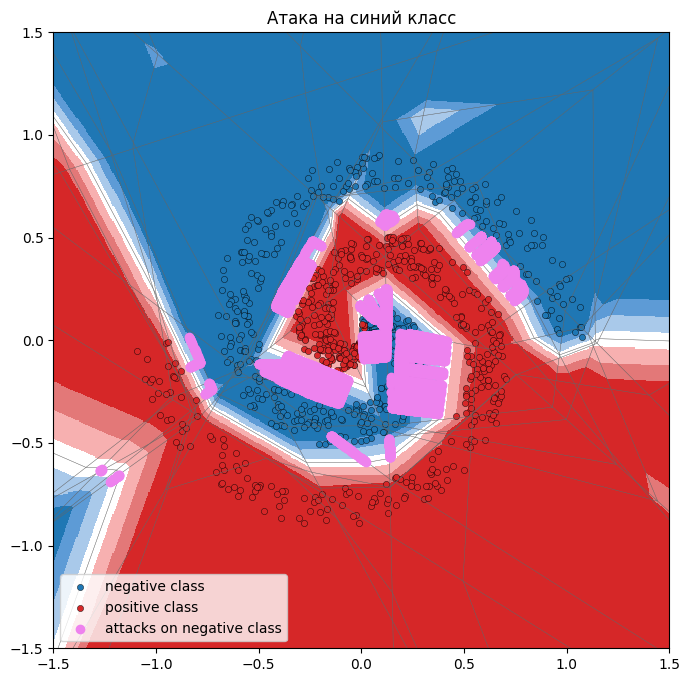

In [86]:
make_experiments(diffes = [0.01, 0.025, 0.05, 0.1], sign_modes = ['mixture', 'input'], mask_types = ['all'], X_pos=X_pos, X_neg=X_neg, ignore_targets=[True, False], lb = np.array([-1.7, -1.4]), ub=np.array([1.56, 1.35]), models = [unar_net, mlp_net], train_df=df_train)

### experiments with much larger boundaries

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


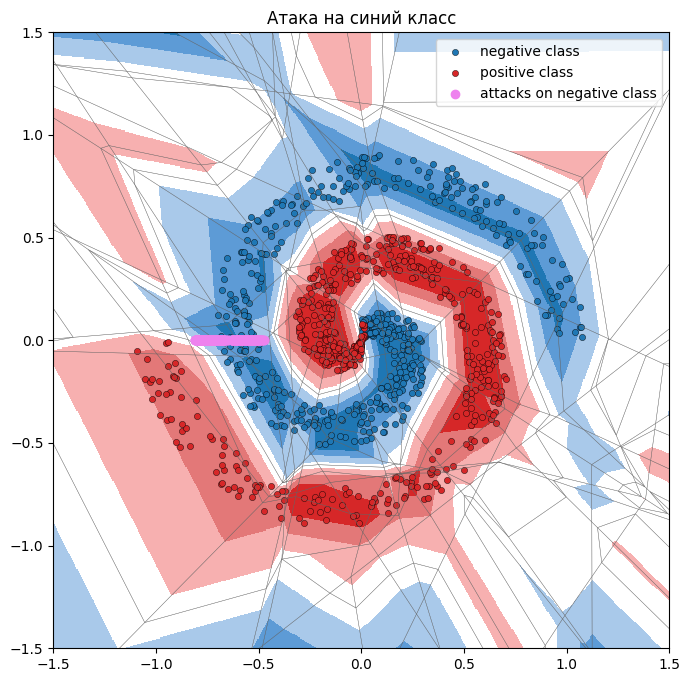

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


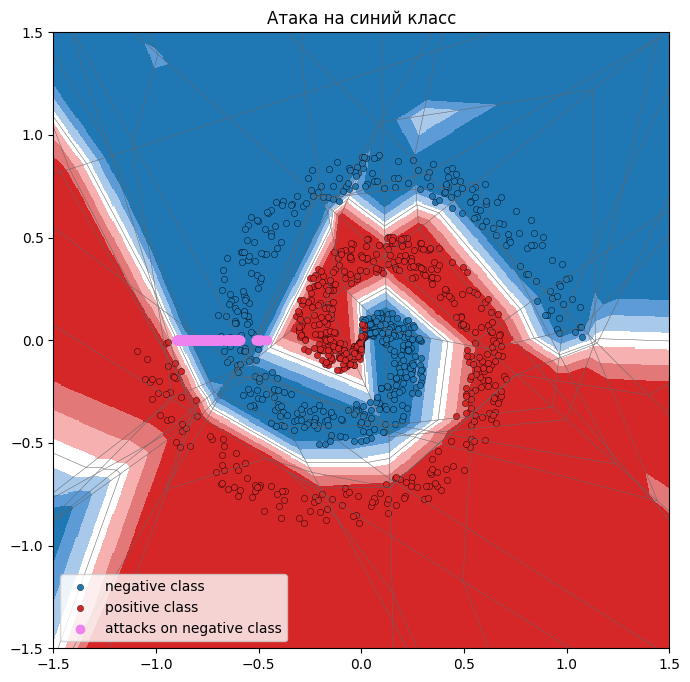

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = True, model_ind = 1
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = False, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = False, model_ind = 1
нет успешных атак
_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


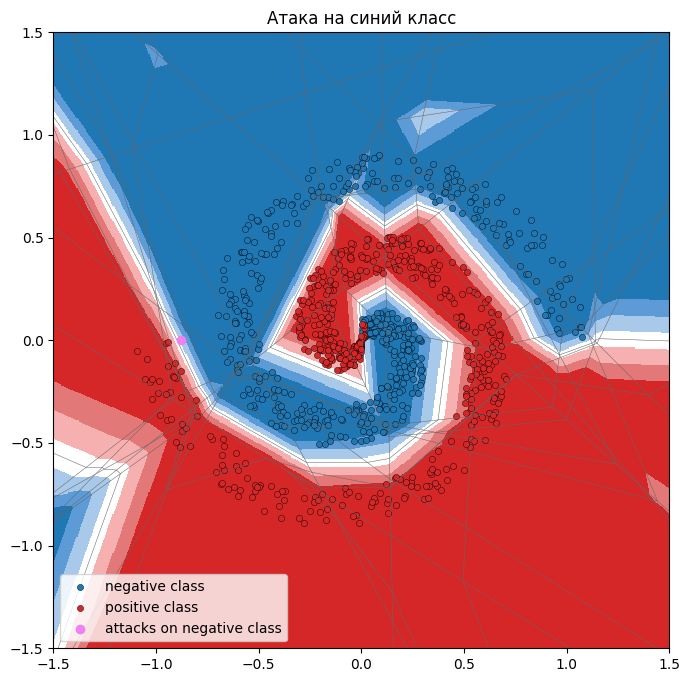

_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


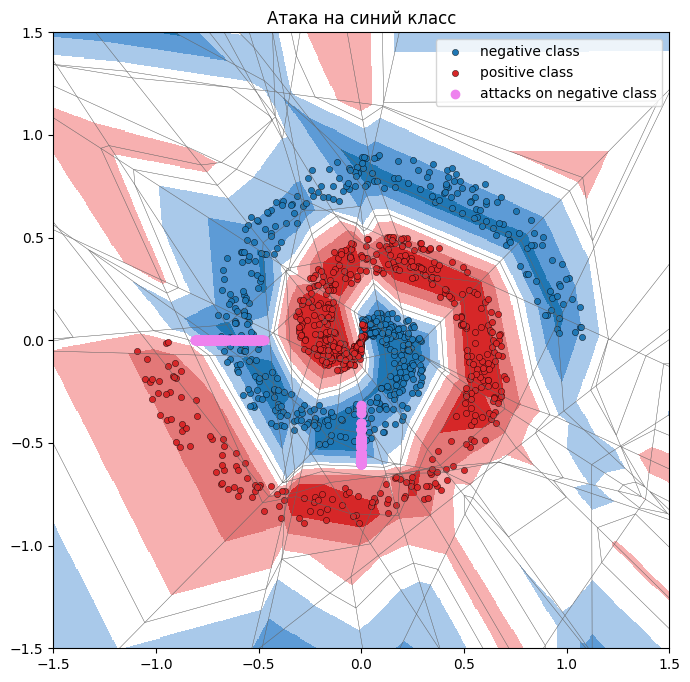

_______________________________________
diff = 0.025, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


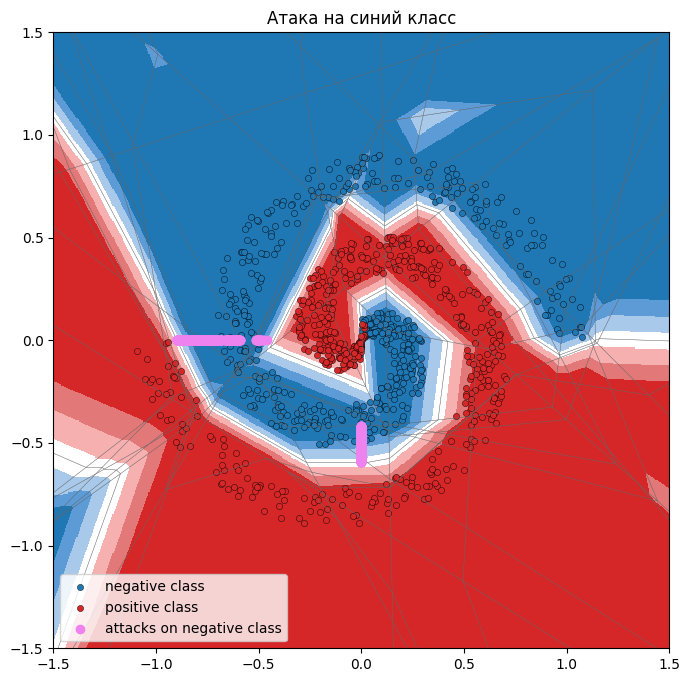

_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = True, model_ind = 1


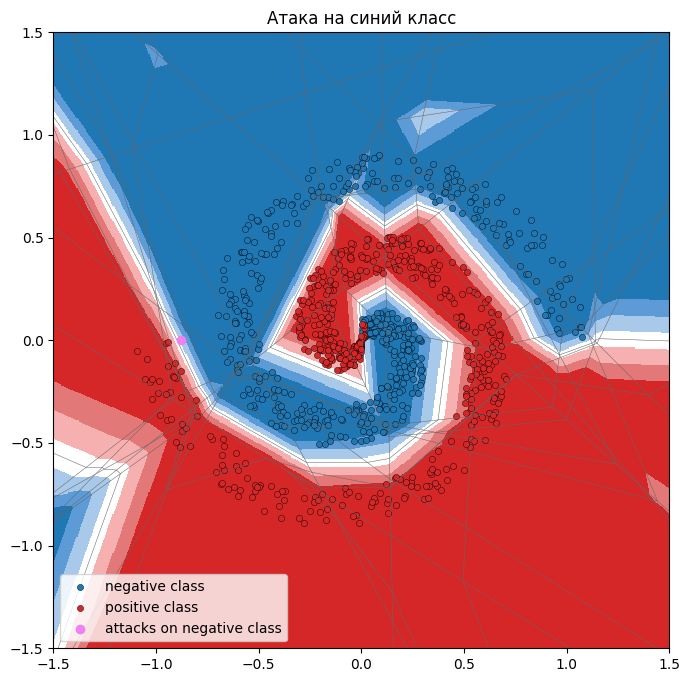

_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = False, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.025, mask = all, sign_mode = input, ignore target = False, model_ind = 1


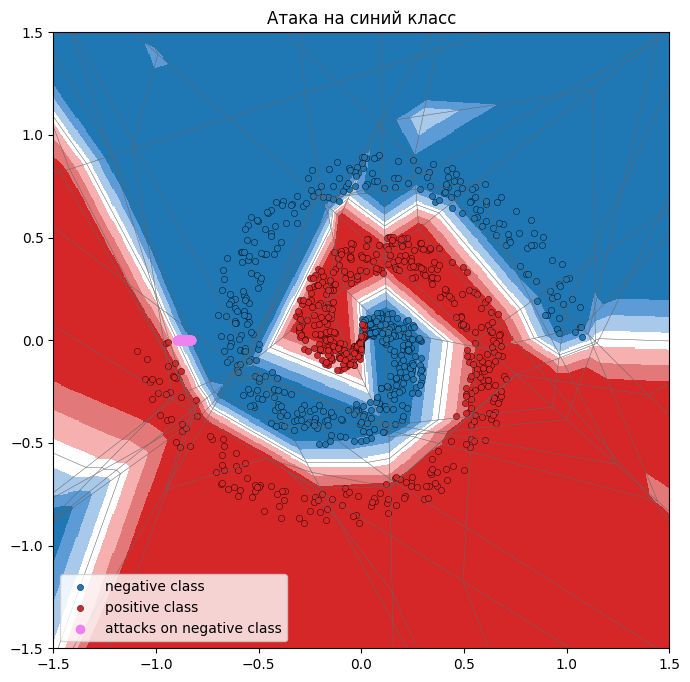

_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


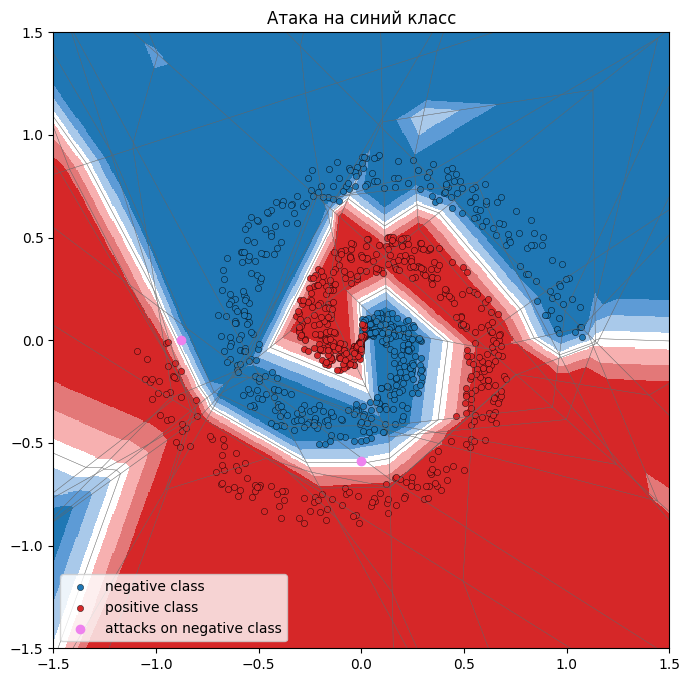

_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


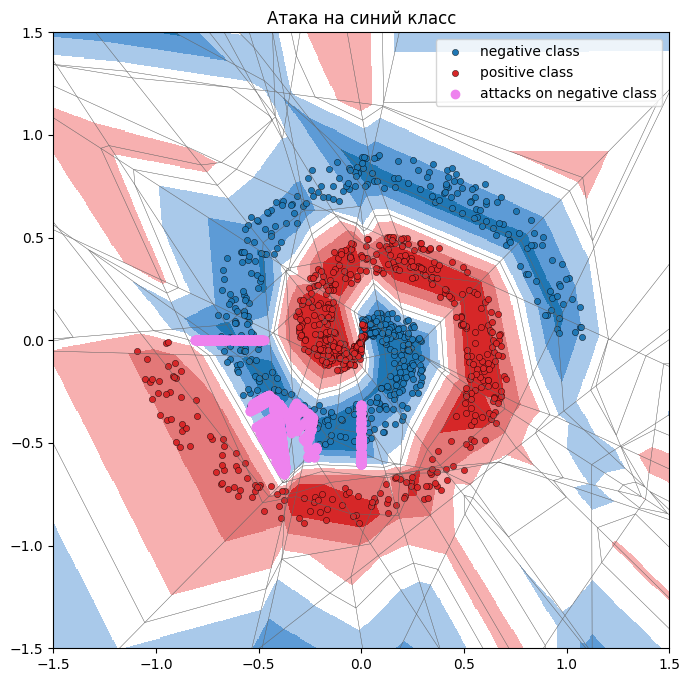

_______________________________________
diff = 0.05, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


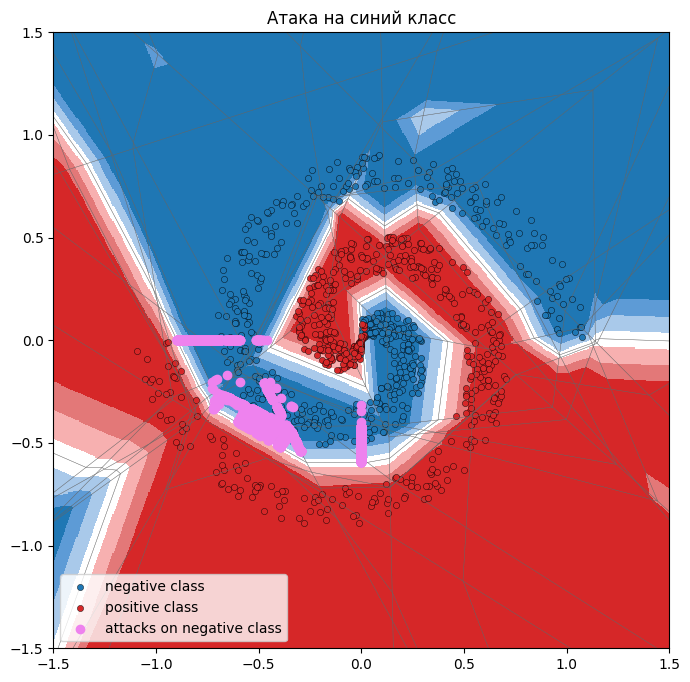

_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = True, model_ind = 1


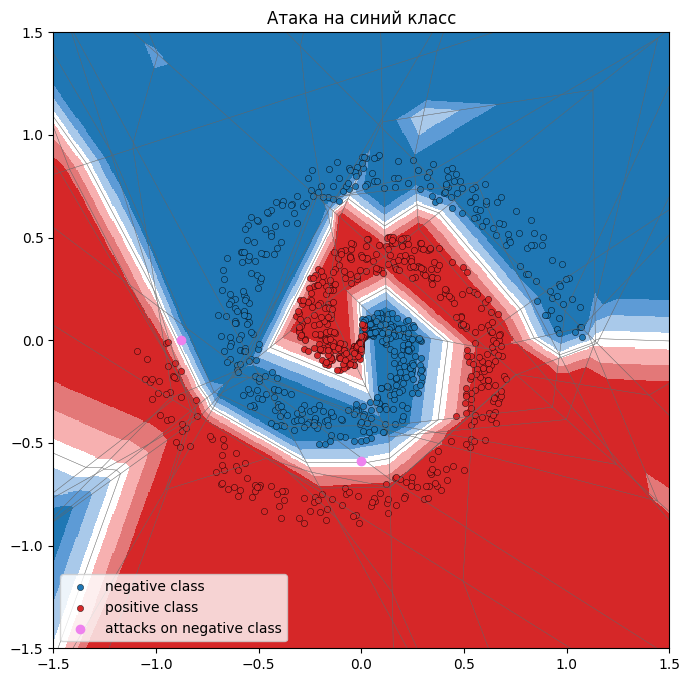

_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = False, model_ind = 0


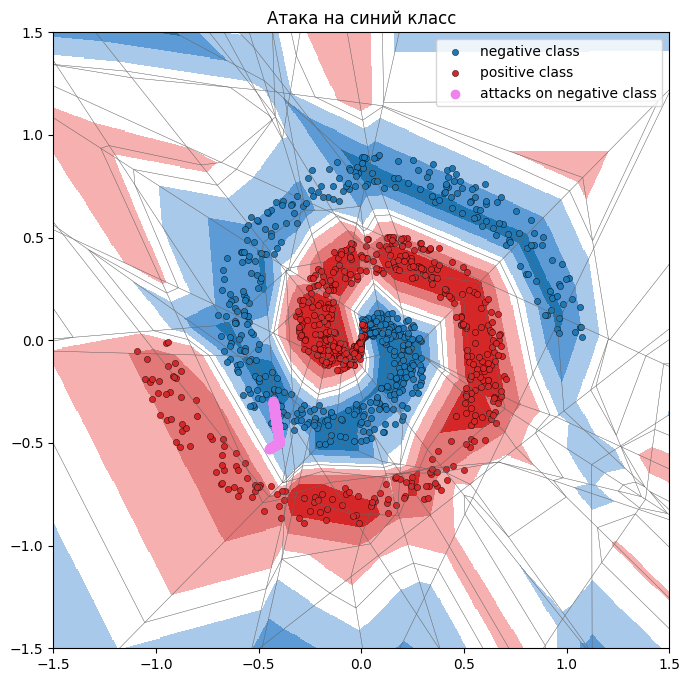

_______________________________________
diff = 0.05, mask = all, sign_mode = input, ignore target = False, model_ind = 1


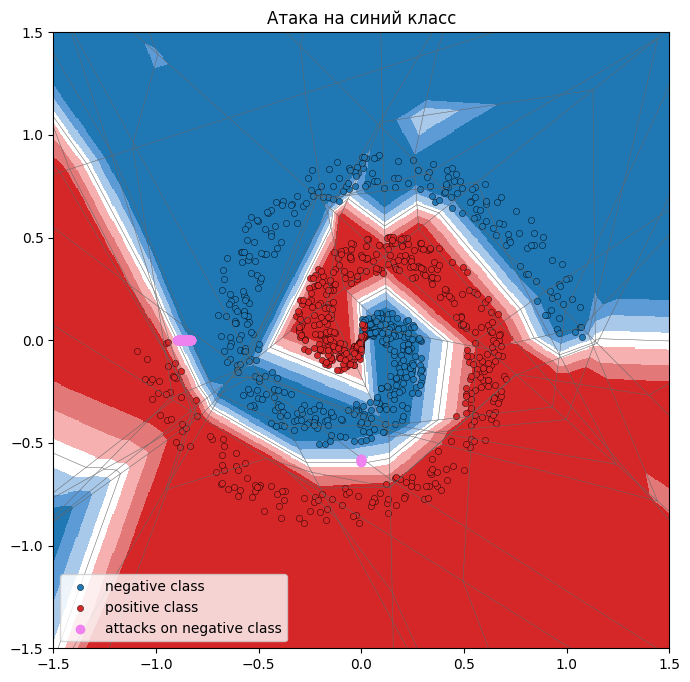

_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


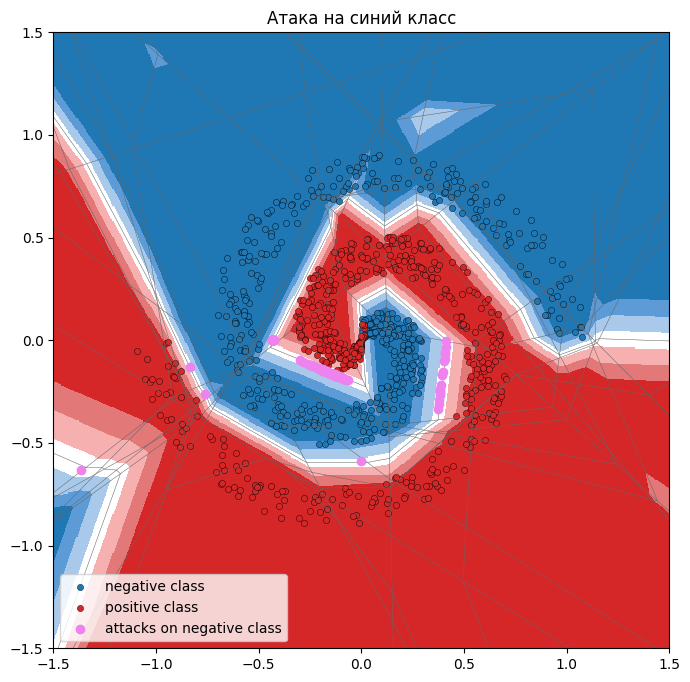

_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


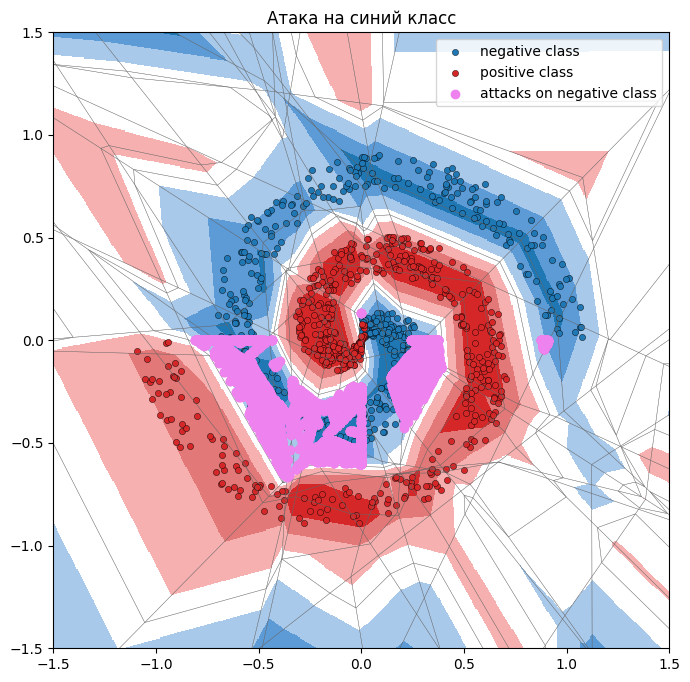

_______________________________________
diff = 0.1, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


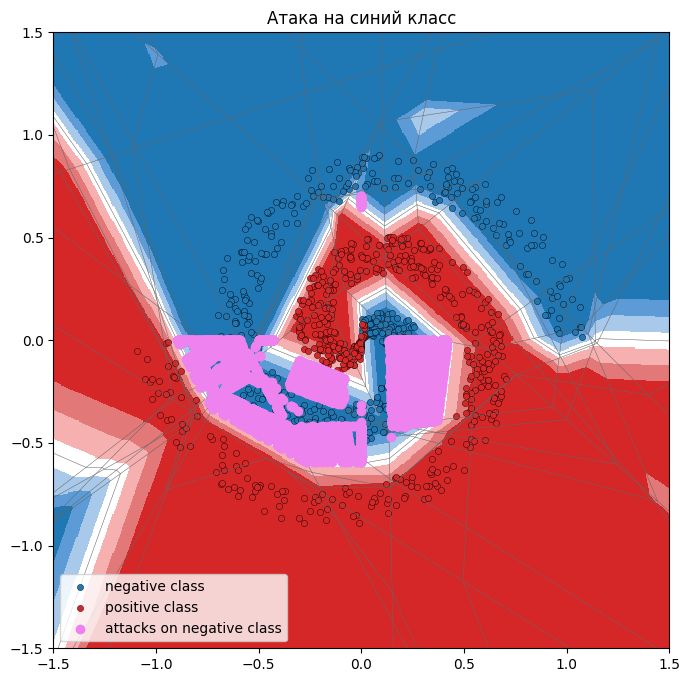

_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = True, model_ind = 0
нет успешных атак
_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = True, model_ind = 1


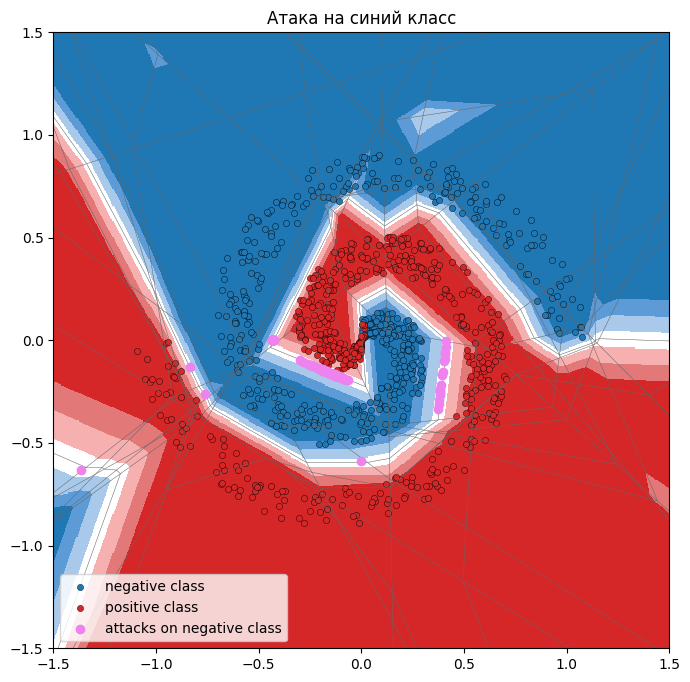

_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = False, model_ind = 0


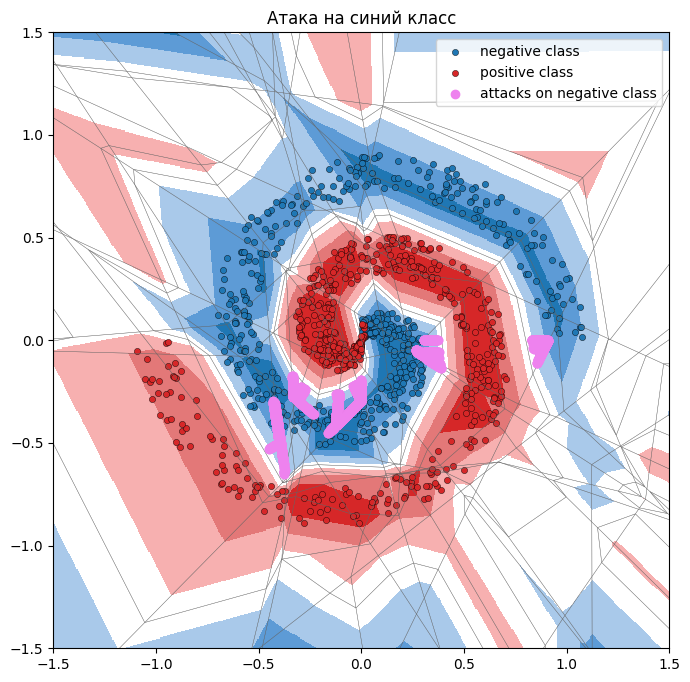

_______________________________________
diff = 0.1, mask = all, sign_mode = input, ignore target = False, model_ind = 1


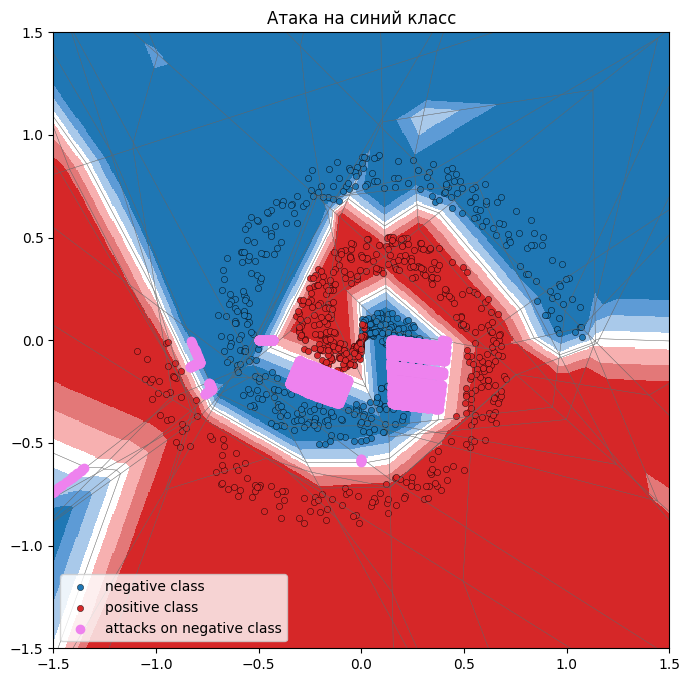

In [80]:
make_experiments(diffes = [0.01, 0.025, 0.05, 0.1], sign_modes = ['mixture', 'input'], mask_types = ['all'], X_pos=X_pos, X_neg=X_neg, ignore_targets=[True, False], lb = np.array([-5, -5]), ub=np.array([5, 5]), models = [unar_net, mlp_net], train_df=df_train)

### experiments with matrix attack

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = True, model_ind = 0


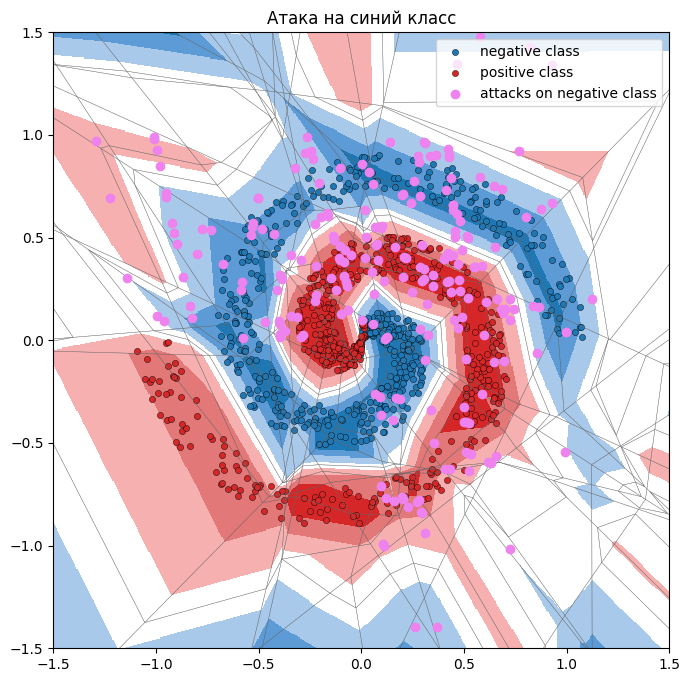

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = True, model_ind = 1


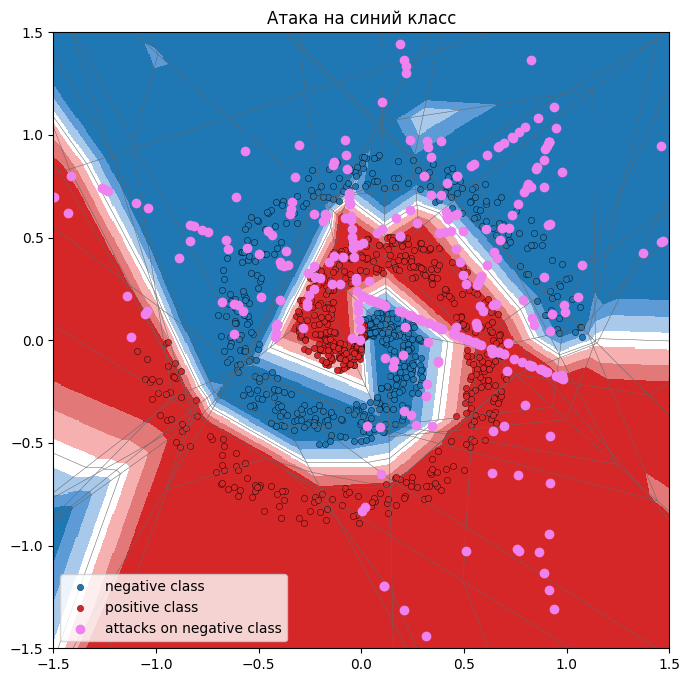

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = False, model_ind = 0


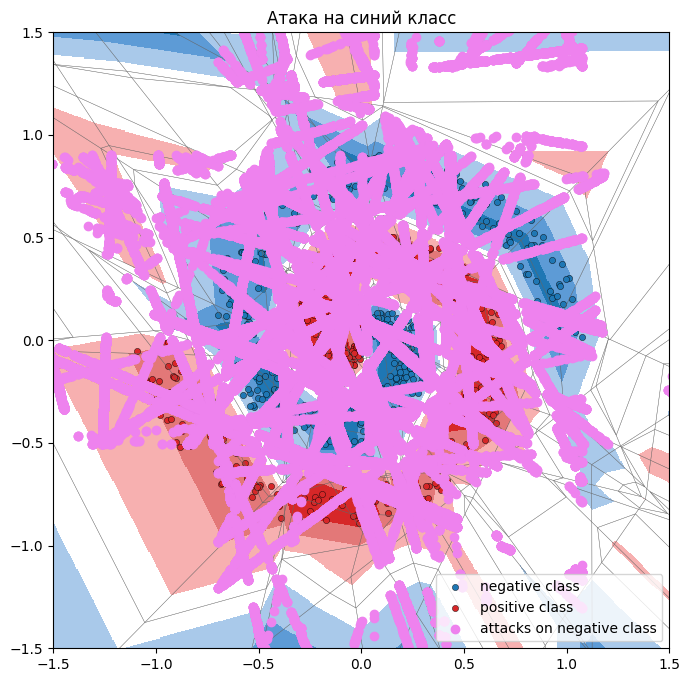

_______________________________________
diff = 0.01, mask = all, sign_mode = mixture, ignore target = False, model_ind = 1


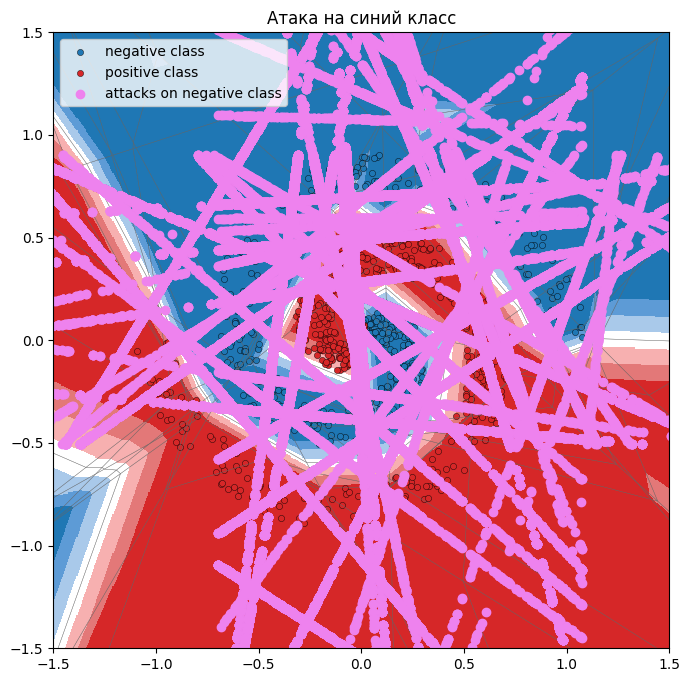

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = True, model_ind = 0


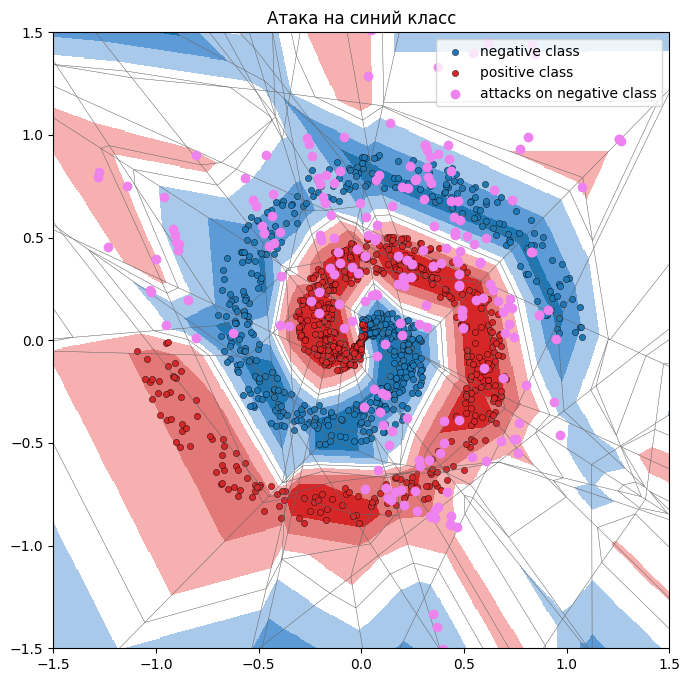

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = True, model_ind = 1


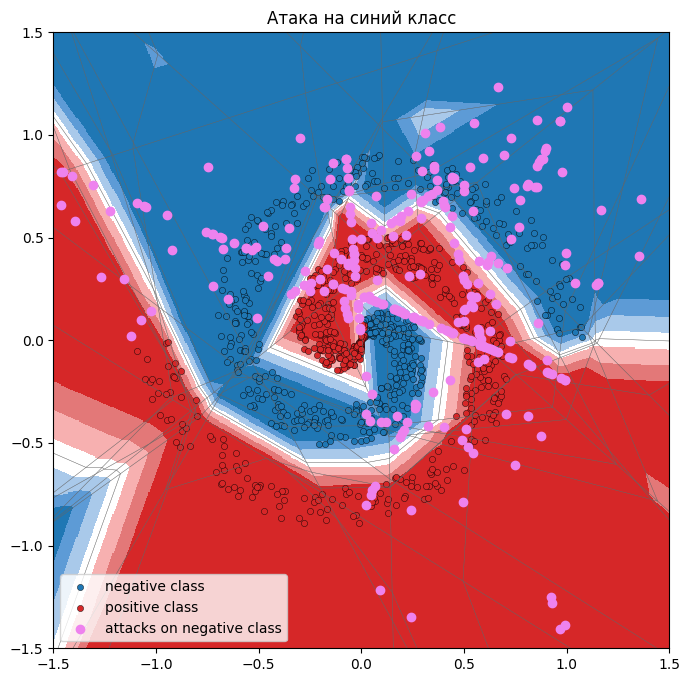

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = False, model_ind = 0


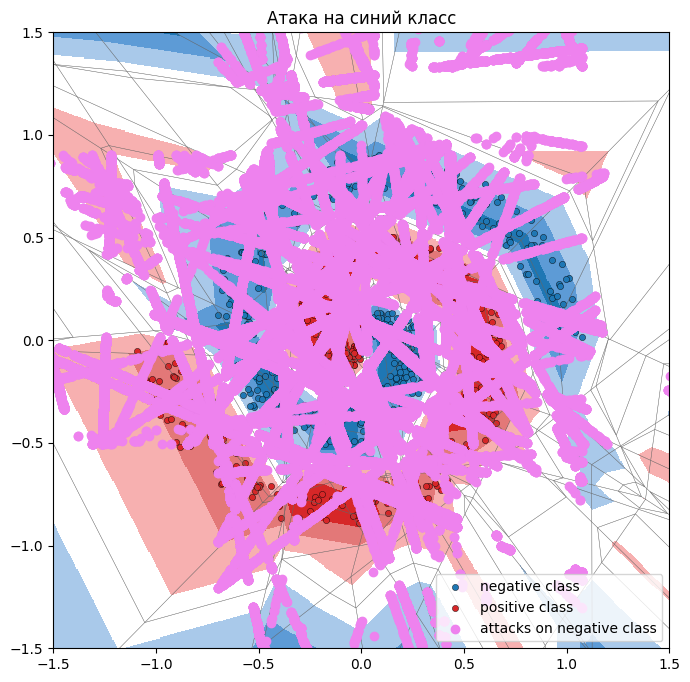

_______________________________________
diff = 0.01, mask = all, sign_mode = input, ignore target = False, model_ind = 1


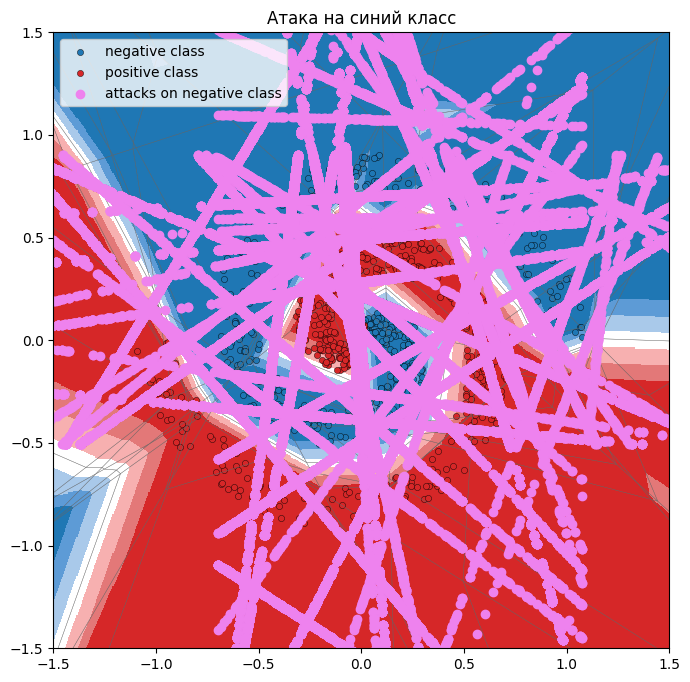

In [85]:
make_experiments(diffes = [0.01], sign_modes = ['mixture', 'input'], mask_types = ['all'], X_pos=X_pos, X_neg=X_neg, ignore_targets=[True, False], lb = np.array([-1.7, -1.4]), ub=np.array([1.56, 1.35]), models = [unar_net, mlp_net], train_df=df_train, attack_mode="matrix")